In [87]:
import importlib
import Preprocessing 
import Plotting
import Optimization
from matpowercaseframes import CaseFrames
import numpy as np
import pandas as pd
from Utilities_python import genfuel


importlib.reload(Preprocessing)
from Preprocessing import process_generation_data, fix_bus_numbers, map_generators_to_buses, map_loads_to_buses, make_bus_susceptance_matrix

## Load case_path## Load caseframe
case_path = './pglib_opf/case_ACTIVSg2000.m'
cf = CaseFrames(case_path)

baseMVA = cf.baseMVA
NB = len(cf.bus)
NG = len(cf.gen)
NL = len(cf.branch)

c = cf.gencost['COST_1'].reset_index(drop=True)
cf.gen = cf.gen.reset_index(drop=True)
cf.gen['genfuel'] = genfuel
cf.gen['cost'] = c

## Fix bus numbers
cf.gen = fix_bus_numbers(cf.gen, cf.bus['BUS_I'], cf.bus,'GEN_BUS')
cf.branch = fix_bus_numbers(cf.branch, cf.bus['BUS_I'], cf.bus, 'F_BUS')
cf.branch = fix_bus_numbers(cf.branch, cf.bus['BUS_I'], cf.bus, 'T_BUS')

## Define maximum and minimum generation limits
min_p_mw = cf.gen['PMIN'].reset_index(drop=True)/baseMVA
max_p_mw = cf.gen['PMAX'].reset_index(drop=True)/baseMVA

map_generators = map_generators_to_buses(cf.gen, cf.gen['new_bus'], NB)
map_loads, len_loads = map_loads_to_buses(cf.bus, baseMVA)
congestion_factor = 1
b, branch_cap = make_bus_susceptance_matrix(cf.branch, baseMVA, congestion_factor, NB)


min_p_mw = cf.gen['PMIN'].reset_index(drop=True)/baseMVA
max_p_mw = cf.gen['PMAX'].reset_index(drop=True)/baseMVA

loads = cf.bus['PD']/baseMVA


In [99]:
indices = np.where(line_loading > 90)[0]
len(indices)

108

In [34]:
importlib.reload(Optimization)
from Optimization import dc_opf
model, theta, pg, balance_constraint = dc_opf(cf.gen['cost'], map_generators, map_loads, max_p_mw, min_p_mw, loads, len_loads,branch_cap, b, NG, NB, baseMVA, ref_bus=0)


Statistics for model Unnamed:
  Linear constraint matrix    : 7335 Constrs, 7878 Vars, 23881 NZs
  Matrix coefficient range    : [ 1, 3055.68 ]
  Objective coefficient range : [ 697.5, 2908.5 ]
  Variable bound range        : [ 0.00315, 87.04 ]
  RHS coefficient range       : [ 0.00021, 43.52 ]
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 7335 rows, 7878 columns and 23881 nonzeros
Model fingerprint: 0xe11a004c
Coefficient statistics:
  Matrix range     [1e+00, 3e+03]
  Objective range  [7e+02, 3e+03]
  Bounds range     [3e-03, 9e+01]
  RHS range        [2e-04, 4e+01]
Presolve removed 3894 rows and 4155 columns
Presolve time: 0.03s
Presolved: 3441 rows, 3723 columns, 16894 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0      handle free variables              

In [30]:
cf.baseMVA

100

In [31]:
importlib.reload(Optimization)
from Optimization import results_dc_opf

theta_, pg_, LMP_ = results_dc_opf(theta, pg, balance_constraint, NB)

In [33]:
max(c)

29.085

Elastic loads -- maximizing social welfare

In [155]:
from Optimization import max_social_welfare_fixed_load_bid, opt_results
load_bid = 15.6
model, theta, pg, pl, balance_constraint = max_social_welfare_fixed_load_bid(load_bid, c, map_generators, map_loads, max_p_mw, min_p_mw, loads, len_loads, branch_cap, b, NG, NB, baseMVA)



Statistics for model Unnamed:
  Linear constraint matrix    : 7335 Constrs, 9003 Vars, 25006 NZs
  Matrix coefficient range    : [ 1, 3055.68 ]
  Objective coefficient range : [ 697.5, 2908.5 ]
  Variable bound range        : [ 0.0007, 87.04 ]
  RHS coefficient range       : [ 0.19, 43.52 ]
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 7335 rows, 9003 columns and 25006 nonzeros
Model fingerprint: 0x0e218458
Coefficient statistics:
  Matrix range     [1e+00, 3e+03]
  Objective range  [7e+02, 3e+03]
  Bounds range     [7e-04, 9e+01]
  RHS range        [2e-01, 4e+01]
Presolve removed 3840 rows and 4571 columns
Presolve time: 0.03s
Presolved: 3495 rows, 4432 columns, 17873 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0      handle free variables                  

In [156]:
import Optimization 

importlib.reload(Optimization)
from Optimization import max_social_welfare_fixed_load_bid, opt_results
theta_result, pg_result, LMPs = opt_results(theta, pg, pl, balance_constraint, max_p_mw, NB, NG, len_loads)

sum gen = 219.7703214179927
sum load = 219.77032141789238
sum green gen = 170.93512141799266
max green gen = 179.7972
sum black gen = 48.83519999999999
max black gen = 783.1181


In [129]:
np.mean(alpha)

4.978323178261

In [4]:
ge.head()

,max_p_mw,genfuel,bus,c
0,1.5825,wind,3,0.0
1,0.2573,wind,5,0.0
2,0.6187,wind,8,0.0
3,0.1000,solar,10,0.0
4,1.4963,wind,20,0.0


In [9]:
generation = max_green_max_black(generation, 0.1, randomseed)

In [119]:
condition_green = generation['genfuel'].isin(["wind", "hydro", "solar", "nuclear"])
green_generation = generation.loc[condition_green]
sum_of_green_gen = sum(green_generation['max_p_mw'])
sum_of_gen = sum(generation['max_p_mw'])
sum_of_green_gen/sum_of_gen

1.0

In [116]:
map_green_generators, map_black_generators, generation, green_generation, black_generation, max_green, max_black = process_generation_data(max_p_mw, cf.gen, cf.gencost, NB)

In [88]:
import Optimization 
importlib.reload(Preprocessing)
from Preprocessing import process_generation_data, fix_bus_numbers, map_generators_to_buses, map_loads_to_buses, make_bus_susceptance_matrix, max_green_max_black, max_green_max_black_nuclear_black
# ratio_green_black = 0.8
# ## 1
#  
map_green_generators, map_black_generators, generation, green_generation, black_generation, max_green, max_black = process_generation_data(max_p_mw, cf.gen, cf.gencost, NB)
ratio_green = 0.5
randomseed = 10

generation = max_green_max_black(generation, ratio_green, randomseed)
#generation = max_green_max_black_nuclear_black(generation, ratio_green, randomseed)
# 
generation = pd.read_csv('generation_case2_50_2.csv')
# generation.to_csv('generation_case2_80_3.csv')
# # generation = pd.read_csv('')

    
map_green_generators, map_black_generators, generation, green_generation, black_generation, max_green, max_black = process_generation_data(max_p_mw, cf.gen, cf.gencost, NB, generation = generation)

In [73]:
sum(max_black)

864.8995000000009

In [168]:
generation.to_csv('generation_RES80.csv')

In [68]:
generation.head()

,max_p_mw,genfuel,bus,c
0,1.5825,wind,3,0.0000
1,0.2573,wind,5,0.0000
2,0.6187,coal,8,18.2743
3,0.1000,solar,10,0.0000
4,1.4963,wind,20,0.0000


In [106]:
np.sum(max_green), np.sum(max_black)

(179.7972, 783.1181)

In [74]:
import Optimization  # Assuming 'functions' is the module you want to reload

importlib.reload(Optimization)
from Optimization import max_social_welfare_fixed_load_bid, opt_results, max_social_welfare_dual_dispatch, opt_results_dual_dispatch

alpha = 5
load_bid = 15
model, theta, pg_green, pg_black, pl, balance_constraint = max_social_welfare_dual_dispatch(alpha, load_bid, green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, NG, baseMVA, ref_bus=0)
theta_, pg_black_, pg_green_, LMP_ = opt_results_dual_dispatch(theta, pg_green, pg_black, pl, balance_constraint, green_generation, black_generation, len_loads, NB)


Statistics for model Unnamed:
  Linear constraint matrix    : 7335 Constrs, 9003 Vars, 25006 NZs
  Matrix coefficient range    : [ 1, 3055.68 ]
  Objective coefficient range : [ 197.5, 2908.5 ]
  Variable bound range        : [ 0.0007, 87.04 ]
  RHS coefficient range       : [ 0.19, 43.52 ]
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 7335 rows, 9003 columns and 25006 nonzeros
Model fingerprint: 0x8534f927
Coefficient statistics:
  Matrix range     [1e+00, 3e+03]
  Objective range  [2e+02, 3e+03]
  Bounds range     [7e-04, 9e+01]
  RHS range        [2e-01, 4e+01]
Presolve removed 3840 rows and 4571 columns
Presolve time: 0.04s
Presolved: 3495 rows, 4432 columns, 17873 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0      handle free variables                  

Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 1 rows, 2544 columns and 2544 nonzeros
Model fingerprint: 0x34129231
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [3e-02, 3e+01]
  Bounds range     [7e-04, 1e+01]
  RHS range        [0e+00, 0e+00]
Presolve removed 0 rows and 1244 columns
Presolve time: 0.01s
Presolved: 1 rows, 1300 columns, 1300 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.5341922e+03   6.973576e+01   0.000000e+00      0s
       1    2.4943577e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds (0.00 work units)
Optimal objective  2.494357730e+03
24071.590000000015
24071.590000000007
Market clearing price for maximizing producer surplus: 16.688342803966133
Producer surplus: 81347

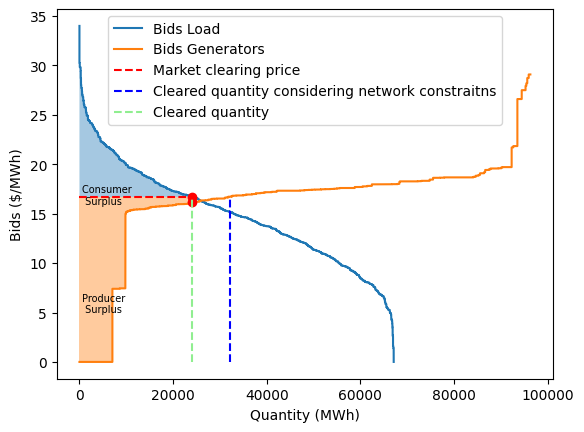

Green generation dispatch: 9801.58
Black generation dispatch: 14098.320000000007


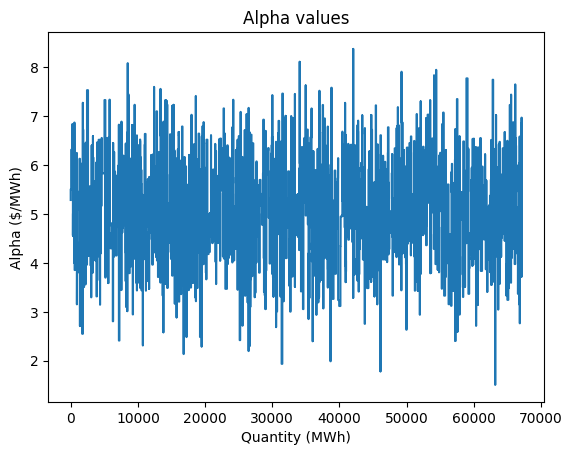

In [63]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

random.seed(10)
# load_bids = np.random.normal(loc=30, scale=5, size=2000)
load_bids = np.random.normal(loc=15, scale=5, size=2000)
# load_bids = np.random.normal(loc=20, scale=5, size=2000)
load_bids = np.maximum(load_bids, 0)
#alpha = np.zeros(2000)
alpha = np.random.normal(loc=5, scale=3, size=2000)
alpha = np.maximum(alpha, 0)
alpha = np.zeros(2000)
bids = pd.DataFrame()
bids['bids'] = load_bids
bids['alpha'] = alpha
# loads_new = loads[loads !=0]
bids['max_load'] = 1.2*cf.bus['PD'].reset_index(drop=True)

bids = pd.read_csv('bids_case1.csv')
# generation = pd.read_csv('generation_case2_80.csv')

bids_sorted = bids.sort_values(by='bids',ascending=False)
bids_sorted['accumulated load'] = bids_sorted['max_load'].cumsum() 
bids_sorted['accumulated alpha'] = bids_sorted['alpha'].cumsum()
gen_bids = pd.DataFrame()
# gen_bids['offers'] = cf.gen['cost'].reset_index(drop=True)
# gen_bids['genfuel'] = cf.gen['genfuel'].reset_index(drop=True)

gen_bids['offers'] = generation['c'].reset_index(drop=True)
gen_bids['genfuel'] = generation['genfuel'].reset_index(drop=True)

gen_bids['max_p_mw'] = max_p_mw*baseMVA
gen_bids_sorted = gen_bids.sort_values(by='offers')
gen_bids_sorted['accumulated offers'] = gen_bids_sorted['max_p_mw'].cumsum() 
# bids_sorted.plot(kind = 'line', x ='accumulated load', y = 'bids')
plt.step(bids_sorted['accumulated load'], bids_sorted['bids'], where = 'post',label = 'Bids Load')
# plt.plot(bids_sorted['accumulated load'], bids_sorted['accumulated alpha'], label)
plt.step(gen_bids_sorted['accumulated offers'], gen_bids_sorted['offers'], where ='post', label ='Bids Generators')
# gen_bids_sorted.plot(kind = 'line', x ='accumulated offers', y = 'offers')

import gurobipy as gp
from gurobipy import GRB
model = gp.Model()
load_bids = bids_sorted['bids'].reset_index(drop=True)
gen_offers = gen_bids_sorted['offers'].reset_index(drop=True)
pg = [model.addVar(vtype=GRB.CONTINUOUS, lb=0, ub=max_p_mw[g], name=f"pg{g}") for g in range(len(gen_offers))]
pl = [model.addVar(vtype=GRB.CONTINUOUS, lb=0, ub=loads[g], name=f"pl{g}") for g in range(len(load_bids))]
obj = (gp.quicksum(load_bids[g]*pl[g] for g in range(len(load_bids)))-gp.quicksum(gen_offers[g]*pg[g] for g in range(len(gen_offers))))
model.setObjective(obj, gp.GRB.MAXIMIZE)

# obj = -(gp.quicksum(load_bids[g]*pl[g] for g in range(len(load_bids)))+gp.quicksum(gen_offers[g]*pg[g] for g in range(len(gen_offers))))
# model.setObjective(obj, gp.GRB.MINIMIZE)

model.addConstr(gp.quicksum(pg[g] for g in range(len(gen_offers)))-gp.quicksum(pl[g] for g in range(len(load_bids)))==0)

model.update()
# model.printStats()
model.optimize()

pg_ = []
for i in range(len(gen_offers)):
    # print(f'pg{i}:', pg[i].X)
    pg_.append(pg[i].X)
    # print(constraints[i].Pi)
pg_=np.array(pg_)

pl_ = []
for i in range(len(load_bids)):
    # print(f'pg{i}:', pg[i].X)
    pl_.append(pl[i].X)
    # print(constraints[i].Pi)
pl_=np.array(pl_)

print(sum(pl_)*baseMVA)
print(sum(pg_)*baseMVA)

sum_pg = np.sum(pg_) * baseMVA

# Find the index of the first occurrence where accumulated offers exceed sum of generation values
closest_index = np.argmax(gen_bids_sorted['accumulated offers'] > sum(pg_)*baseMVA)
# closest_index = np.abs(np.array(gen_bids_sorted['accumulated offers']) - sum(pg_)*baseMVA).argmin()
closest_index_bids = np.argmin(bids_sorted['accumulated load'] < sum(pl_)*baseMVA)
# closest_index_bids = np.abs(np.array(bids_sorted['accumulated load']) - sum(pl_)*baseMVA).argmin()
# closest_index_bids= np.array(bids_sorted['accumulated load']) - sum(pl_)*baseMVA

idx_gen_bids = gen_bids_sorted['offers'].iloc[closest_index+1]

# plt.plot(sum(pg_)*baseMVA, gen_bids_sorted['offers'].iloc[closest_index], 'ro')
plt.plot(sum(pl_)*baseMVA, bids_sorted['bids'].iloc[closest_index_bids], 'ro')
plt.plot(sum(pl_)*baseMVA, idx_gen_bids, 'ro')


plt.xlabel('Quantity (MWh)')
plt.ylabel('Bids ($/MWh)')
# plt.legend()




print('Market clearing price for maximizing producer surplus:', bids_sorted['bids'].iloc[closest_index_bids])
MCP = bids_sorted['bids'].iloc[closest_index_bids]
MCV = bids_sorted['accumulated load'].iloc[closest_index_bids]
# MCV = sum(pl_)*baseMVA

producer_surplus = sum(bids_sorted['bids'].iloc[:closest_index_bids]*bids_sorted['max_load'].iloc[:closest_index_bids])-MCP*MCV
consumer_surplus = MCP*MCV-sum(gen_bids_sorted['offers'].iloc[:closest_index]*gen_bids_sorted['max_p_mw'].iloc[:closest_index])

print('Producer surplus:', producer_surplus)
print('Consumer surplus:', consumer_surplus)

social_welfare = producer_surplus+consumer_surplus

print('Social welfare:', social_welfare)

# plt.fill_between(X, Y, 0, color='blue', alpha=.1)

cleared_quantity_constraints = 321.91355639702425*100

plt.hlines(y=MCP, xmin=0, xmax=MCV, color='r', linestyle='--', label='Market clearing price')
plt.vlines(x=cleared_quantity_constraints, ymin = 0, ymax =MCP, color= 'b', linestyle = '--', label = 'Cleared quantity considering network constraitns')
plt.vlines(x=MCV, ymin = 0, ymax =MCP, color= 'lightgreen', linestyle = '--', label = 'Cleared quantity')
plt.legend()
plt.fill_between(bids_sorted['accumulated load'][:closest_index_bids],bids_sorted['bids'][:closest_index_bids], MCP, step="pre", alpha=0.4, label='Consumer Surplus')
plt.fill_between(gen_bids_sorted['accumulated offers'][:closest_index], MCP, gen_bids_sorted['offers'][:closest_index], step="post", alpha=0.4, label = 'Producer Surplus')
plt.text(500, 16, 'Consumer \n Surplus', fontsize = 7)
plt.text(500, 5, 'Producer \n Surplus', fontsize = 7)



# bids_sorted.plot(kind = 'line', x ='accumulated load', y = 'alpha')
plt.show()


plt.step(bids_sorted['accumulated load'], bids_sorted['alpha'], where = 'post')
plt.xlabel('Quantity (MWh)')
plt.ylabel('Alpha ($/MWh)')
plt.title('Alpha values')

sliced_df = gen_bids_sorted.iloc[:closest_index-1] #is the last one fully dispatched??

last_gen_dispatch = MCV - gen_bids_sorted['accumulated offers'].iloc[closest_index-1]


# Filter the sliced DataFrame based on the condition
filtered_df_green = sliced_df[sliced_df['genfuel'].isin(["wind", "hydro", "solar", "nuclear"])]
filtered_df_black = sliced_df[sliced_df['genfuel'].isin(["ng", "coal"])]

# Sum the values in the 'generation' column of the filtered DataFrame
total_generation_green = filtered_df_green['max_p_mw'].sum()
total_generation_black = filtered_df_black['max_p_mw'].sum()

last_gen = gen_bids_sorted.iloc[closest_index]
if gen_bids_sorted['genfuel'][closest_index] in ["wind", "hydro", "solar", "nuclear"]:
    total_generation_green = total_generation_green+ last_gen_dispatch
else:
    total_generation_black= total_generation_black + last_gen_dispatch

print('Green generation dispatch:',total_generation_green)
print('Black generation dispatch:', total_generation_black)


Total Accepted Quantity: 24071.590000000022 MWh
Total Price: $1926.2348987499988
15.872
15.863348630662667
Market clearing price for maximizing producer surplus: 15.863348630662667
Producer surplus: 81347.14513065194
Consumer surplus: 157586.2937767615
Social welfare: 238933.43890741345


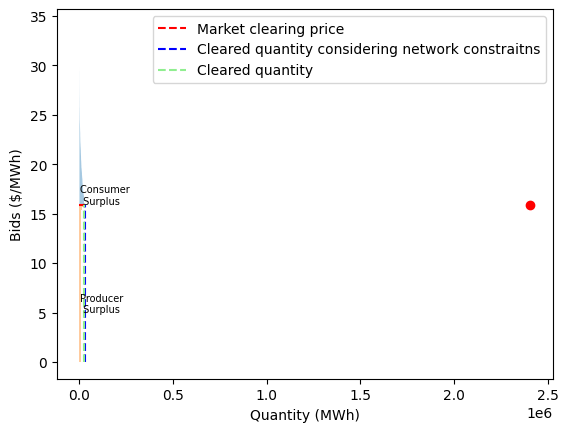

In [64]:
import numpy as np

# Sample data
offer_prices = gen_offers      # Generators: price per MWh
offer_quantities = max_p_mw   # Generators: available MWh
bid_prices = load_bids        # Loads: price per MWh
bid_quantities = loads     # Loads: required MWh

# Combine prices and quantities into tuples and sort them
offers = sorted(zip(offer_prices, offer_quantities), key=lambda x: x[0])
bids = sorted(zip(bid_prices, bid_quantities), key=lambda x: x[0], reverse=True)

# Variables to store total accepted quantity and total price
total_accepted_quantity = 0
total_price = 0

offer_index = 0
bid_index = 0

# Iterate and match offers and bids
while offer_index < len(offers) and bid_index < len(bids):
    offer_price, offer_qty = offers[offer_index]
    bid_price, bid_qty = bids[bid_index]
    
    if offer_price <= bid_price:
        matched_qty = min(offer_qty, bid_qty)
        
        total_accepted_quantity += matched_qty
        total_price += matched_qty * offer_price
        
        offers[offer_index] = (offer_price, offer_qty - matched_qty)
        bids[bid_index] = (bid_price, bid_qty - matched_qty)
        
        if offers[offer_index][1] == 0:
            offer_index += 1
        
        if bids[bid_index][1] == 0:
            bid_index += 1
    else:
        break

# Handle partial acceptance of the last offer or bid
if offer_index < len(offers) and bid_index < len(bids):
    offer_price, offer_qty = offers[offer_index]
    bid_price, bid_qty = bids[bid_index]
    
    if offer_price <= bid_price:
        matched_qty = min(offer_qty, bid_qty)
        
        total_accepted_quantity += matched_qty
        total_price += matched_qty * offer_price
        
        market_clearing_price = bid_price
        producer_surplus += matched_qty * (market_clearing_price - bid_price)
        consumer_surplus += matched_qty * (bid_price - market_clearing_price)

total_accepted_quantity = 100*total_accepted_quantity
# Output the results
print("Total Accepted Quantity: {} MWh".format(total_accepted_quantity))
print("Total Price: ${}".format(total_price))

print(offer_price)
print(bid_price)


# plt.plot(sum(pg_)*baseMVA, gen_bids_sorted['offers'].iloc[closest_index], 'ro')
plt.plot(total_accepted_quantity*baseMVA, bid_price, 'ro')


plt.xlabel('Quantity (MWh)')
plt.ylabel('Bids ($/MWh)')
# plt.legend()




print('Market clearing price for maximizing producer surplus:', bid_price)
MCP = bid_price
MCV = total_accepted_quantity
# MCV = sum(pl_)*baseMVA

# producer_surplus = bids[bid_index]*-MCP*MCV
# consumer_surplus = MCP*MCV-sum(gen_bids_sorted['offers'].iloc[:closest_index]*gen_bids_sorted['max_p_mw'].iloc[:closest_index])

print('Producer surplus:', producer_surplus)
print('Consumer surplus:', consumer_surplus)

social_welfare = producer_surplus+consumer_surplus

print('Social welfare:', social_welfare)

# plt.fill_between(X, Y, 0, color='blue', alpha=.1)

cleared_quantity_constraints = 321.91355639702425*100

plt.hlines(y=MCP, xmin=0, xmax=MCV, color='r', linestyle='--', label='Market clearing price')
plt.vlines(x=cleared_quantity_constraints, ymin = 0, ymax =MCP, color= 'b', linestyle = '--', label = 'Cleared quantity considering network constraitns')
plt.vlines(x=MCV, ymin = 0, ymax =MCP, color= 'lightgreen', linestyle = '--', label = 'Cleared quantity')
plt.legend()
plt.fill_between(bids_sorted['accumulated load'][:closest_index_bids],bids_sorted['bids'][:closest_index_bids], MCP, step="pre", alpha=0.4, label='Consumer Surplus')
plt.fill_between(gen_bids_sorted['accumulated offers'][:closest_index], MCP, gen_bids_sorted['offers'][:closest_index], step="post", alpha=0.4, label = 'Producer Surplus')
plt.text(500, 16, 'Consumer \n Surplus', fontsize = 7)
plt.text(500, 5, 'Producer \n Surplus', fontsize = 7)
plt.show()

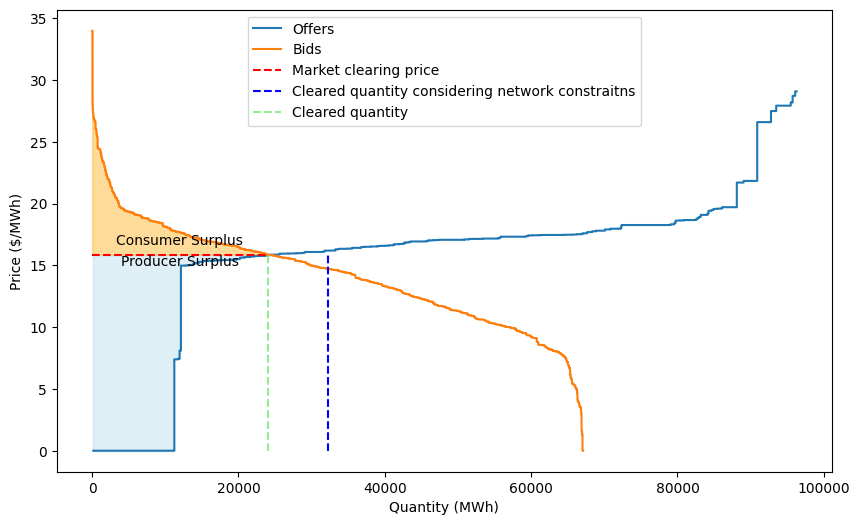

Market Clearing Volume (MCV): 24071.590000000022 MWh
Market Clearing Price (MCP): $15.863348630662667 per MWh
Producer Surplus: $81347.14513065194
Consumer Surplus: $157586.2937767615


In [65]:
# Prepare data for plotting
offer_prices_sorted = np.array([price for price, qty in offers])
# offer_quantities_sorted = np.array([qty for price, qty in offers])
bid_prices_sorted = np.array([price for price, qty in bids])


# Cumulative quantities for plotting
offer_cum_qty = np.cumsum(offer_quantities)*100
bid_cum_qty = np.cumsum(bid_quantities)*100

# Plot
plt.figure(figsize=(10, 6))

# Plot offers
plt.step(offer_cum_qty, offer_prices_sorted, where='post', label='Offers')
# Plot bids
plt.step(bid_cum_qty, bid_prices_sorted, where='post', label='Bids')

# Highlight the market clearing price and volume
# plt.axvline(x=total_accepted_quantity, ymin = 0, ymax = MCP, color='lightgreen', linestyle='--', label='MCV')
# plt.axhline(y=MCP, xmin=0, xmax = total_accepted_quantity, color='b', linestyle='--', label='MCP')

# Shade areas for producer and consumer surplus
# plt.fill_betweenx(offer_prices_sorted, 0, offer_cum_qty, where=(offer_cum_qty <= total_accepted_quantity), 
#                   color='orange', alpha=0.5, label='Producer Surplus')
# plt.fill_betweenx(bid_prices_sorted, 0, bid_cum_qty, where=(bid_cum_qty <= total_accepted_quantity), 
#                   color='yellow', alpha=0.5, label='Consumer Surplus')

plt.fill_between(bid_cum_qty[:bid_index], bid_prices_sorted[:bid_index], MCP, step="pre", alpha=0.4, color='orange')
plt.fill_between(offer_cum_qty[:offer_index], MCP, offer_prices_sorted[:offer_index], step="post", alpha=0.4, color='lightblue')

# # Add text annotations
# plt.text(total_accepted_quantity, MCP, 
#          f' MCP = ${MCP}\n MCV = {total_accepted_quantity} MWh',
#          horizontalalignment='right', verticalalignment='bottom', color='red', fontsize=12)

plt.hlines(y=MCP, xmin=0, xmax=MCV, color='r', linestyle='--', label='Market clearing price')
plt.vlines(x=cleared_quantity_constraints, ymin = 0, ymax =MCP, color= 'b', linestyle = '--', label = 'Cleared quantity considering network constraitns')
plt.vlines(x=MCV, ymin = 0, ymax =MCP, color= 'lightgreen', linestyle = '--', label = 'Cleared quantity')

plt.text(bid_cum_qty[bid_index - 1] * 0.5, MCP + (MCP - bid_prices_sorted[bid_index +100]) ,
         f'Consumer Surplus',
         horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)


plt.text(offer_cum_qty[offer_index - 1] * 0.5, offer_prices_sorted[offer_index - 1] - (offer_prices_sorted[offer_index - 1] - MCP) * 0.1,
         f'Producer Surplus',
         horizontalalignment='center', verticalalignment='top', color='black', fontsize=10)

# Labels and legend
plt.xlabel('Quantity (MWh)')
plt.ylabel('Price ($/MWh)')
# plt.title('Market Clearing Price and Volume with Surplus Areas')
plt.legend()

# Show plot
# plt.grid(True)
plt.show()

# Output the results
print("Market Clearing Volume (MCV): {} MWh".format(total_accepted_quantity))
print("Market Clearing Price (MCP): ${} per MWh".format(MCP))
print("Producer Surplus: ${}".format(producer_surplus))
print("Consumer Surplus: ${}".format(consumer_surplus))

In [131]:
sum(max_green)

482.79510000000016

In [63]:

importlib.reload(Optimization)
from Optimization import max_social_welfare_fixed_load_bid, opt_results, max_social_welfare_dual_dispatch, opt_results_dual_dispatch, max_social_welfare_black_green_LMPs
load_bid = bids['bids'].reset_index(drop=True)
alpha = bids['alpha'].reset_index(drop=True)

model, theta, pg_green, pg_black, pl_green, pl_black, balance_constraint, green_balance = max_social_welfare_black_green_LMPs(alpha, load_bid,green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, ref_bus=0)

KeyboardInterrupt: 

In [190]:
import Optimization

importlib.reload(Optimization)
from Optimization import max_social_welfare_fixed_load_bid, opt_results, max_social_welfare_dual_dispatch, opt_results_dual_dispatch, max_social_welfare_black_green_LMPs, opt_results_black_green_LMPs

theta_, pg_black_, pg_green_, pl_green_, pl_black_,  LMP_, lambda_green = opt_results_black_green_LMPs(theta, pg_green, pg_black, pl_green, pl_black, balance_constraint, green_balance, green_generation, black_generation, len_loads, NB)

sum black gen = 27.648656598822697
sum green gen = 79.85857911583528
sum black load = 27.648656598866488
sum green load = 79.85857911583528


In [25]:
min(LMP_)

15.680999999849742

In [71]:
print(sum(green_generation['max_p_mw']))

179.79719999999998


In [75]:
importlib.reload(Optimization)
from Optimization import max_social_welfare_black_green_LMPs2
load_bid = bids['bids'].reset_index(drop=True)
alpha = bids['alpha'].reset_index(drop=True)

model, theta, pg_green, pg_black, pl_green, pl_black, green_balance, green_difference, black_difference, difference = max_social_welfare_black_green_LMPs2(alpha, load_bid,green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, ref_bus=0)


Statistics for model Unnamed:
  Linear constraint matrix    : 12461 Constrs, 15253 Vars, 38915 NZs
  Matrix coefficient range    : [ 1, 3055.68 ]
  Objective coefficient range : [ 1.57222, 44.4228 ]
  Variable bound range        : [ 0.0007, 87.04 ]
  RHS coefficient range       : [ 0.19, 43.52 ]
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 12461 rows, 15253 columns and 38915 nonzeros
Model fingerprint: 0x8de5a182
Coefficient statistics:
  Matrix range     [1e+00, 3e+03]
  Objective range  [2e+00, 4e+01]
  Bounds range     [7e-04, 9e+01]
  RHS range        [2e-01, 4e+01]
Presolve removed 8320 rows and 9477 columns
Presolve time: 0.36s
Presolved: 4141 rows, 5776 columns, 21015 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time:

In [213]:
importlib.reload(Optimization)
from Optimization import opt_results_black_green_LMPs2

theta_, pg_black_, pg_green_, pl_green_, pl_black_, lambda_green, diff = opt_results_black_green_LMPs2(theta, pg_green, pg_black, pl_green, pl_black, green_balance, green_difference, black_difference, difference, green_generation, black_generation, len_loads, NB)

NameError: name 'green_difference' is not defined

In [ ]:
import Optimization

importlib.reload(Optimization)
from Optimization import max_social_welfare_fixed_load_bid, opt_results, max_social_welfare_dual_dispatch, opt_results_dual_dispatch, max_social_welfare_black_green_LMPs, opt_results_black_green_LMPs

theta_, pg_black_, pg_green_, pl_green_, pl_black_,  LMP_, lambda_green = opt_results_black_green_LMPs(theta, pg_green, pg_black, pl_green, pl_black, balance_constraint, green_balance, green_generation, black_generation, len_loads, NB)

In [16]:
alpha = np.random.normal(loc=5, scale=1, size=2000)
alpha = np.maximum(alpha, 0)
# alpha = np.zeros(2000)

In [52]:
alpha

0       3.532833
1       5.336523
2       6.478143
3       4.426226
4       4.850529
          ...   
1995    3.739326
1996    5.166727
1997    6.452286
1998    6.584611
1999    4.451692
Name: alpha, Length: 2000, dtype: float64

In [59]:
generation.to_csv('generation_case2.csv')

In [35]:
bids.to_csv('bids_case1.csv')

In [93]:
importlib.reload(Optimization)
from Optimization import max_social_welfare_black_green_LMPs_v3
bids = pd.read_csv('bids_case1.csv')
load_bid = bids['bids'].reset_index(drop=True)
alpha = bids['alpha'].reset_index(drop=True)
# alpha= np.random.normal(loc=5, scale=2, size=2000)
# alpha = alpha*10
alpha = np.maximum(alpha, 0)
alpha= np.zeros(2000)

model, theta, pg_green, pg_black, pl_green, pl_black, balance_constraint, green_balance= max_social_welfare_black_green_LMPs_v3(alpha, load_bid,green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, ref_bus=0)


Statistics for model Unnamed:
  Linear constraint matrix    : 8461 Constrs, 11253 Vars, 29790 NZs
  Matrix coefficient range    : [ 1, 3055.68 ]
  Objective coefficient range : [ 0.0337168, 30.2532 ]
  Variable bound range        : [ 0.0007, 87.04 ]
  RHS coefficient range       : [ 0.19, 43.52 ]
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i7-1355U, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 12 logical processors, using up to 12 threads

Optimize a model with 8461 rows, 11253 columns and 29790 nonzeros
Model fingerprint: 0x7680376d
Coefficient statistics:
  Matrix range     [1e+00, 3e+03]
  Objective range  [3e-02, 3e+01]
  Bounds range     [7e-04, 9e+01]
  RHS range        [2e-01, 4e+01]
Presolve removed 4313 rows and 6125 columns
Presolve time: 0.03s
Presolved: 4148 rows, 5128 columns, 20038 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0      handle free variables           

In [94]:
import Optimization

importlib.reload(Optimization)
from Optimization import opt_results_black_green_LMPs_v3

theta_, pg_black_, pg_green_, pl_green_, pl_black_,  LMP_, lambda_green = opt_results_black_green_LMPs_v3(theta, pg_green, pg_black, pl_green, pl_black, balance_constraint, green_balance, green_generation, black_generation, len_loads, NB)

sum black gen = 0.0
sum green gen = 321.8299588511966
sum black load = 1.60152335837437931331805884838104248046875E-10
sum green load = 321.8299588511966


In [91]:
lambda_green

1.7815406126974302

In [57]:
# alpha = bids['alpha'].reset_index(drop=True)
# # alpha= np.random.normal(loc=5, scale=2, size=2000)
# # alpha = alpha*10
# alpha = np.maximum(alpha, 0)
alpha_df = pd.DataFrame()
alpha_df['bids'] = alpha
alpha_df['load number'] = range(0, len(alpha))

In [58]:
alpha_df

,bids,load number
0,3.532833,0
1,5.336523,1
2,6.478143,2
3,4.426226,3
4,4.850529,4
...,...,...
1995,3.739326,1995
1996,5.166727,1996
1997,6.452286,1997
1998,6.584611,1998


In [59]:
alpha_sorted = alpha_df.sort_values(by ='bids')

In [157]:
import Optimization
importlib.reload(Optimization)
from Optimization import max_social_welfare_black_green_LMPs_v3, max_social_welfare_black_green_LMPs_v5
bids = pd.read_csv('bids_case1.csv')
load_bid = bids['bids'].reset_index(drop=True)
alpha = bids['alpha'].reset_index(drop=True)
# alpha=alpha = np.random.normal(loc=5, scale=1, size=2000)
alpha = np.maximum(alpha, 0)
#alpha= np.zeros(2000)

#model, theta, pg_green, pg_black, pl_green, pl_black,  black_balance_constraint, green_balance_constraint, green_balance= max_social_welfare_black_green_LMPs_v5(alpha, load_bid,green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, ref_bus=0)
model, theta, pg_green, pg_black, pl_green, pl_black,  black_balance_constraint, green_balance_constraint, epsilon_balance, epsilon_green, epsilon_black, black_balance = max_social_welfare_black_green_LMPs_v5(alpha, load_bid,green_generation, black_generation, max_green, max_black, map_black_generators, map_green_generators, map_loads, len_loads, loads, b, branch_cap, NB, ref_bus=0)

KeyboardInterrupt: 

In [65]:
import Optimization

importlib.reload(Optimization)
from Optimization import opt_results_black_green_LMPs_v5

theta_, pg_black_, pg_green_, pl_green_, pl_black_,  black_LMP_, green_LMP_, lambda_epsilon= opt_results_black_green_LMPs_v5(theta, pg_green, pg_black, pl_green, pl_black, black_balance_constraint, green_balance_constraint, epsilon_balance, epsilon_green, epsilon_black, green_generation, black_generation, len_loads, NB)

sum black gen = 10.13
sum green gen = 169.43964938890838
sum black load = 10.129999999999995
sum green load = 169.43964938890838


c:\Users\emijo\OneDrive - Danmarks Tekniske Universitet\Dokumenter\GitHub\DualPriceDispatch\Optimization.py:758: RuntimeWarning: invalid value encountered in scalar divide
  green_LMP_.append(lambda_epsilon[i]*(epsilon_black[i].X)/(epsilon_green[i].X + epsilon_black[i].X))
c:\Users\emijo\OneDrive - Danmarks Tekniske Universitet\Dokumenter\GitHub\DualPriceDispatch\Optimization.py:763: RuntimeWarning: invalid value encountered in scalar divide


In [49]:
black_balance.Pi

14.900873283234265

In [53]:
green_balance.Pi

AttributeError: 'gurobipy.Constr' object has no attribute 'Pi'

In [52]:
black_balance_ = []
for i in range(len(black_balance_constraint)):
   black_balance_.append(black_balance_constraint[i].Pi)

In [33]:
epsilon_black_ = []
for i in range(len(epsilon_black)):
    epsilon_black_.append(epsilon_black[i].X)

epsilon_black_ = np.array(epsilon_black_)

epsilon_green_ = []
for i in range(len(epsilon_green)):
    epsilon_green_.append(epsilon_green[i].X)

epsilon_green_ = np.array(epsilon_green_)

flow_node = 

In [105]:
## Emissions
import Preprocessing
importlib.reload(Preprocessing)
from Preprocessing import *

map_wind_generators, map_solar_generators, map_hydro_generators, map_coal_generators, map_nuclear_generators, map_ng_generators = process_generation_data_emissions(max_p_mw, cf.gen, cf.gencost, NB, generation = generation)
avg_emissions_per_MWh, emisisons_green, emissions_black = get_emissions(pg_green_, pg_black_, map_wind_generators, map_solar_generators, map_hydro_generators, map_coal_generators, map_nuclear_generators, map_ng_generators, baseMVA =100)

avg_emissions_per_MWh, emisisons_green, emissions_black

(142.48119648254598, 46430.33057946297, 0.0)

In [22]:
169.43964938891668/np.sum(max_green)

0.9423931484412253

In [24]:
max(LMP_)

22.880636649546844

In [117]:
lambda_green

31.720870859064238

In [25]:
plt.bar(LMP_)

TypeError: bar() missing 1 required positional argument: 'height'

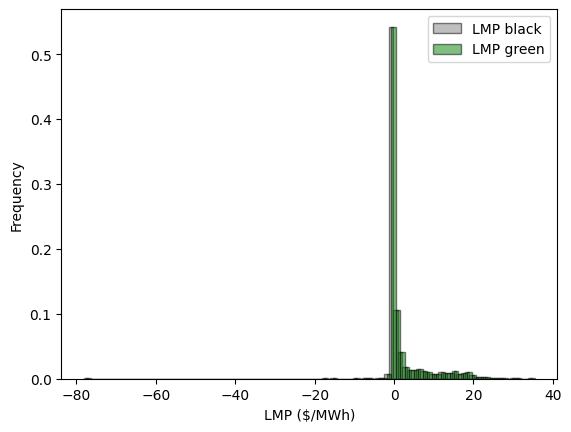

In [189]:
# plt.hist(np.array(LMP_), bins= 100)
import matplotlib.pyplot as plt
n, bins, patches = plt.hist(np.array(LMP_), 100, density=True, facecolor='grey',edgecolor='black', alpha=0.5, lw=1, label='LMP black')
n, bins, patches = plt.hist(np.array(LMP_)+lambda_green, 100, density=True, facecolor='g', edgecolor='black',alpha=0.5, lw=1, label='LMP green')
plt.xlabel('LMP ($/MWh)')
plt.ylabel('Frequency')
plt.legend()

Plotting

In [81]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import pandas as pd

import Plotting 

importlib.reload(Plotting)
from Plotting import dfs_for_plotting

gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'
ercot_coords = gpd.read_file('./ercot_data/ercot_coords.kml', driver='KML')
type(ercot_coords)

bus = cf.bus
bus_index = 'BUS_I'
df_map_LMPs, df_green_LMPs, ercot_coords = dfs_for_plotting(ercot_coords, bus, bus_index, LMP_, lambda_green)



c:\Users\emijo\AppData\Local\Programs\Python\Python38\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [17]:
ercot_coords

,Name,Description,geometry,new_bus
0,SAINT HEDWIG 0,6283,POINT Z (-98.20152 29.43283 0.00000),1332
1,SAN ANTONIO 16 0,6284,POINT Z (-98.44027 29.33960 0.00000),1333
2,BOERNE 2 0,6285,POINT Z (-98.70195 29.85547 0.00000),1334
3,SPICEWOOD 0,6282,POINT Z (-98.10905 30.42632 0.00000),1331
4,SEGUIN 2 0,6279,POINT Z (-97.92628 29.53181 0.00000),1328
...,...,...,...,...
1995,IRVING 1 1,5106,POINT Z (-96.98796 32.91249 0.00000),670
1996,RICHARDSON 2 1,5103,POINT Z (-96.73344 32.96942 0.00000),667
1997,DALLAS 11 0,5100,POINT Z (-96.74276 32.76398 0.00000),664
1998,COMANCHE 0,5101,POINT Z (-98.60555 31.88193 0.00000),665


In [23]:
df_green_LMPs.to_csv('df_green_LMPs_alpha_0_load_bids_15')
df_map_LMPs.to_csv('df_map_LMPs_load_bids_20_alpha_15')

In [10]:
import Plotting 

importlib.reload(Plotting)
from Plotting import plot_folium_hm
hm = plot_folium_hm(df_map_LMPs)


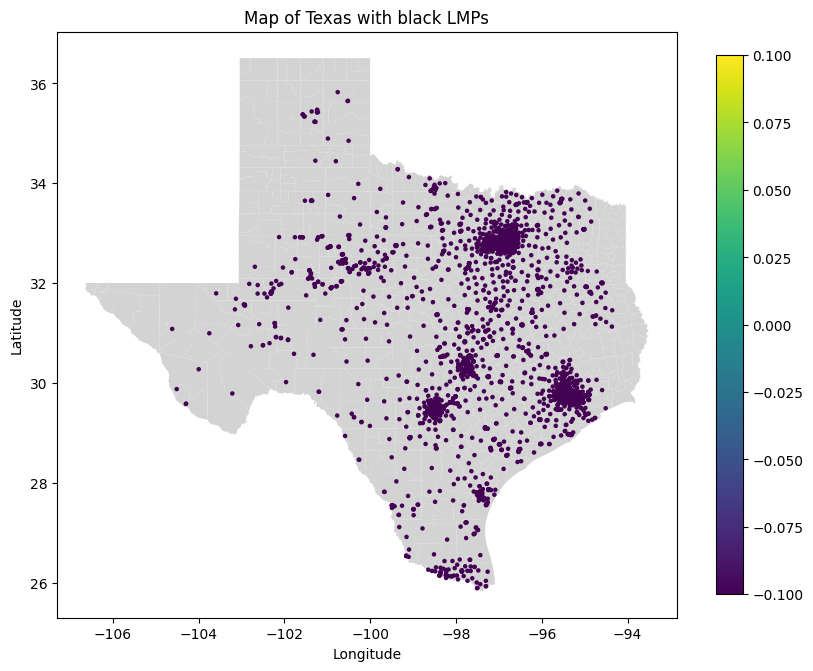

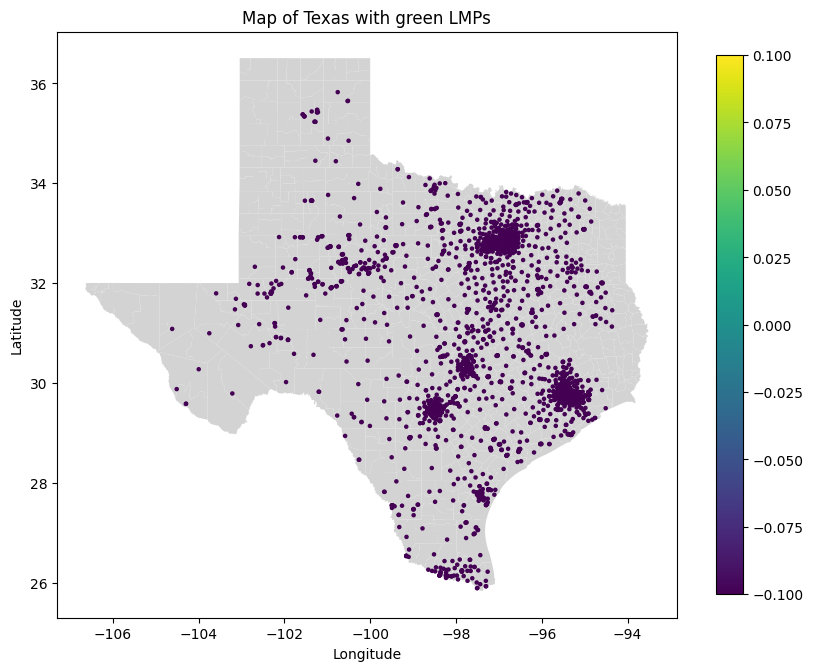

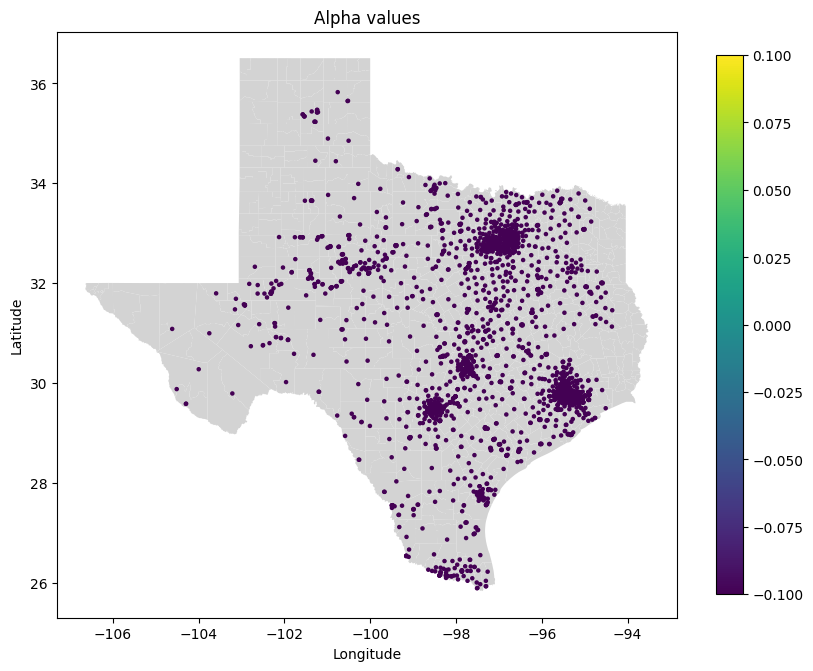

In [73]:
import Plotting 

importlib.reload(Plotting)
from Plotting import plot_LMPs_black, plot_LMPs_green, plot_alpha

vmin = min(np.array(LMP_).min(), (np.array(LMP_)+np.array(lambda_green)).min())  # Min value across both DataFrames
vmax = max(np.array(LMP_).max(), (np.array(LMP_)+np.array(lambda_green)).max())
plot_LMPs_black(ercot_coords, LMP_, vmin, vmax)
plot_LMPs_green(ercot_coords, LMP_, lambda_green, vmin, vmax)
plot_alpha(ercot_coords, alpha)

In [110]:
NL

3206

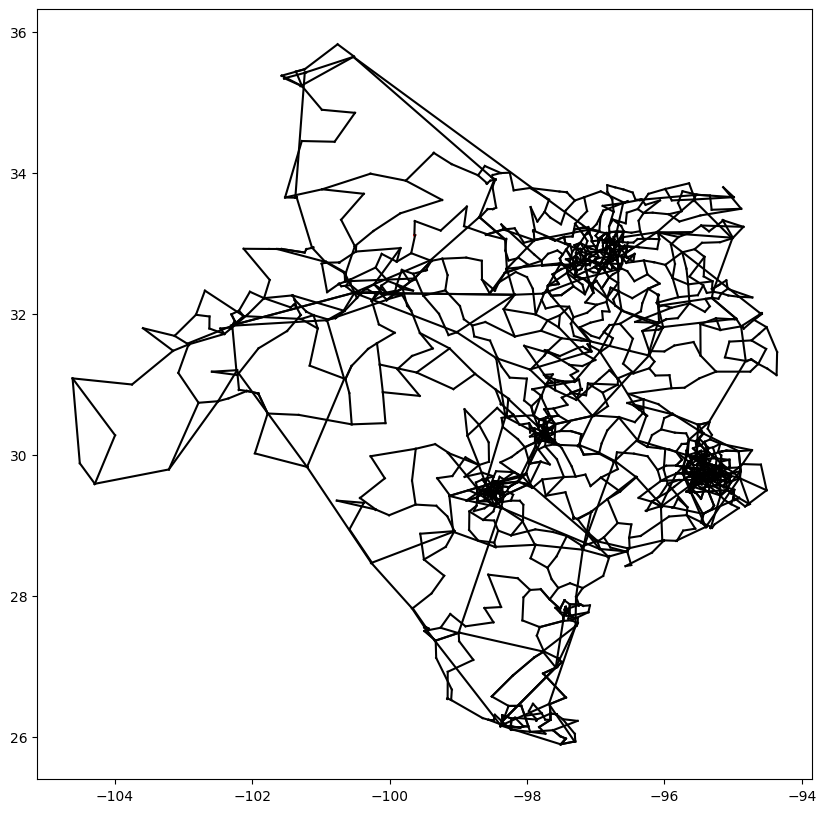

In [18]:
import Plotting 
import matplotlib.pyplot as plt

importlib.reload(Plotting)
from Plotting import plot_lines, plot_LMPs_black, compute_line_loadings
# line_loading, overloaded_lines = compute_line_loadings(theta_, cf.branch,baseMVA, NL)

from_bus = cf.branch['new_from_bus']
to_bus = cf.branch['new_to_bus']
# line_loading = np.random.normal(loc=50, scale=20, size=len(from_bus))

fig, ax = plt.subplots(figsize=(10, 10))

plot_lines(ercot_coords, from_bus, to_bus, line_loading)
# plot_LMPs_black(ax, ercot_coords, LMP_)
plt.show()

In [95]:

importlib.reload(Plotting)
from Plotting import plot_lines, plot_LMPs_black, compute_line_loadings
line_loading, overloaded_lines = compute_line_loadings(congestion_factor,theta_, cf.branch,baseMVA, NL)
overloaded_lines

38

In [139]:
import Plotting, folium

importlib.reload(Plotting)
from Plotting import plot_lines_folium
from_bus = cf.branch['new_from_bus']
to_bus = cf.branch['new_to_bus']
map_center = [31.9686, -99.9018]
map = folium.Map(location=map_center,tiles="CartoDB Positron", zoom_start=6)
plot_lines_folium(map, ercot_coords, from_bus, to_bus, line_loading)


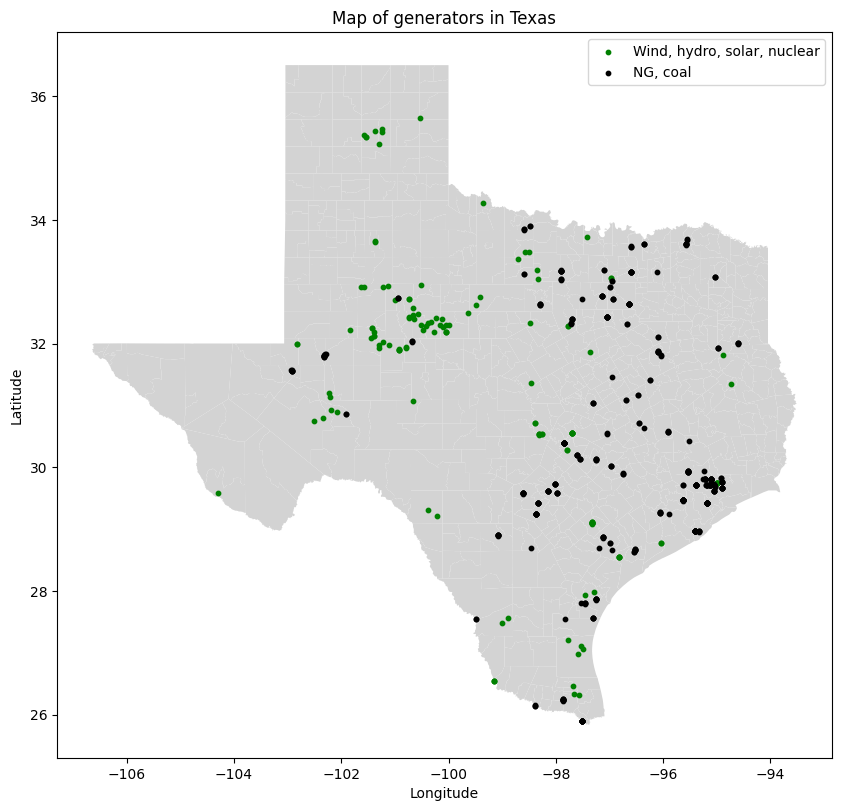

In [78]:
import Plotting 

importlib.reload(Plotting)
from Functions import plot_green_black_gens

plot_green_black_gens(ercot_coords, generation)
# # Show the plot
# plt.show()

In [38]:
# # Iterate over each row in the GeoPandas DataFrame
# def get_color(LMP, max_LMP, min_LMP):
#     if LMP < 0.8*max_LMP:
#         return 'red'
#     elif LMP >= 0. and price < 175:
#         return 'yellow'
#     else:
#         return 'red'

from branca.colormap import LinearColormap
import folium
colors = ['turquoise', 'blue', 'gray', 'black']
colormap = LinearColormap(colors=colors, vmin=min(LMP_), vmax=max(LMP_))
map_center = [31.9686, -99.9018]
mymap = folium.Map(location=map_center, zoom_start=4)
ercot_coords['LMP'] = LMP_
# new_ercot_coords['LMP'] = LMP_new
for index, row in ercot_coords.iterrows():
    # Get the coordinates of the point
    lat = row.geometry.y
    lon = row.geometry.x
    color = colormap(row['LMP'])
    # Add a marker for the point
    folium.CircleMarker(location=[lat, lon], radius=2, color=color, fill=True, popup=f"Bus: {row['new_bus']}<br>LMP:{row['LMP']}").add_to(mymap)

colormap.add_to(mymap)

In [41]:
import Plotting 

importlib.reload(Plotting)
from Plotting import plot_LMPs_folium

map_LMPs = plot_LMPs_folium(ercot_coords, LMP_)

In [26]:
green_generation.head()

,max_p_mw,genfuel,bus,c
0,1.5825,wind,3,0.0
1,0.2573,wind,5,0.0
2,0.6187,wind,8,0.0
3,0.1000,solar,10,0.0
4,1.4963,wind,20,0.0


In [82]:
line_loading, overloaded_lines = compute_line_loadings(congestion_factor, theta_, cf.branch,baseMVA, NL)
overloaded_lines

NameError: name 'compute_line_loadings' is not defined

In [83]:
import importlib
import Plotting
import folium
importlib.reload(Plotting)
from Plotting import *
importlib.reload(Plotting)
from Plotting import plot_lines, plot_LMPs_black, compute_line_loadings
line_loading, overloaded_lines = compute_line_loadings(congestion_factor, theta_, cf.branch,baseMVA, NL)

vmin = min(np.array(LMP_).min(), (np.array(LMP_)+np.array(lambda_green)).min())  # Min value across both DataFrames
vmax = max(np.array(LMP_).max(), (np.array(LMP_)+np.array(lambda_green)).max())

from_bus = cf.branch['new_from_bus']
to_bus = cf.branch['new_to_bus']
map_center = [31.9686, -99.9018]
# map = folium.Map(location=map_center, zoom_start=4)
map = folium.Map(location=map_center,tiles="CartoDB Positron", zoom_start=6)
map = plot_lines_folium(map, ercot_coords, from_bus, to_bus, line_loading)
# map = plot_LMPs_folium(map, ercot_coords, LMP_, vmin, vmax)
#map = plot_LMPs_folium(map, ercot_coords, np.array(LMP_)+lambda_green, vmin, vmax)
map = plot_LMPs_folium_only_red_orange(map, ercot_coords, np.array(LMP_)+lambda_green,vmin, vmax)



# map = plot_alpha_folium(map, ercot_coords, alpha)
# map = plot_green_black_gen_folium(map, ercot_coords, generation)
# map = plot_green_not_dispatched(map, ercot_coords,  green_generation,pg_green_)
# map = plot_green_black_LMPs_folium(map, ercot_coords, LMP_, lambda_green,vmin, vmax)


# map, merged_df = plot_load_bids_folium(map, ercot_coords, bus, load_bid, alpha, NB, baseMVA)
# map = plot_green_LMPs_folium(map, ercot_coords, LMP_, lambda_green, vmin, vmax)
# map_center = [31.9686, -99.9018]
# map = folium.Map(location=map_center, zoom_start=4)

map

In [155]:
map.save("map_50RES_greenLMPs.html")

In [157]:

%reload_ext autoreload
%autoreload 2
from selenium import webdriver

driver = webdriver.Chrome()  # or any other webdriver
driver.get("C:/Users/emijo/OneDrive - Danmarks Tekniske Universitet/Dokumenter/GitHub/DualPriceDispatch/map_50RES_greenLMPs.html") 
driver.set_window_size(1000, 1400)
driver.save_screenshot('map_50RES_greenLMPs.png')

True

In [84]:
overloaded_lines

39

In [221]:
np.mean(LMP_)

13.735384411758343

In [62]:
np.sum(max_black)/(np.sum(max_green)+ np.sum(max_black))*100

81.32782810699966

In [79]:
lambda_green

23.843662590474832

In [42]:
sorted_ercot_coords = new_ercot_coords.sort_values(by='bus', ascending=True)

In [64]:
map.save("alpha_30_load_bids_5_congested_0_5.html")

In [65]:
lambda_green

22.69409579704526

In [24]:

ercot_coords['LMPs'] = LMP_new
ercot_coords.explore(column='LMPs', cmap='bwr')

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
image_path = './ercot_data/Texas.jpg'  # Replace with the actual path to your image file
img = mpimg.imread(image_path)

# Plot the image
plt.imshow(img)
plt.title('Texas')
plt.axis('off')  # Turn off axis labels
plt.show()

Plotting social welfare

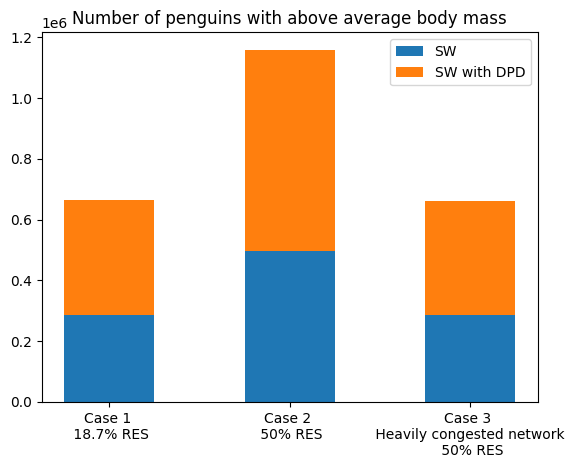

In [35]:
import matplotlib.pyplot as plt
import numpy as np


cases = (
    "Case 1 \n 18.7% RES",
    "Case 2 \n 50% RES",
    "Case 3 \n Heavily congested network \n 50% RES",
)
social_welfare = {
    "SW": np.array([285499, 496156, 287588]),
    "SW with DPD": np.array([378213, 662894, 373918]),
}
width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(3)

for boolean, sw in social_welfare.items():
    p = ax.bar(cases, sw, width, label=boolean, bottom=bottom)
    bottom += sw

ax.set_title("Social welfare")
ax.legend(loc="upper right")

plt.show()

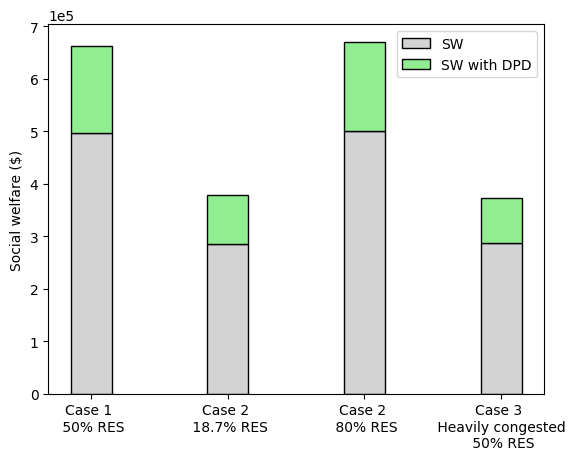

In [151]:
import matplotlib.pyplot as plt
import numpy as np

cases = (
    "Case 1 \n 50% RES",
    "Case 2 \n 18.7% RES",
    "Case 2 \n 80% RES",
    "Case 3 \n Heavily congested \n 50% RES",
)
social_welfare = {
    "SW": np.array([496156,285499, 501297, 287588]),
    "SW with DPD": np.array([662894-496156,378213-285499, 670426-501297, 373918-287588]),
}

socialwelfare_diff = np.array([662894-496156,378213-285499, 670426-501297, 373918-287588])
increase_sw = np.array([ 662894, 378213, 670426, 373918])/np.array([496156, 285499,  501297, 287588])*100-100

width = 0.3

fig, ax = plt.subplots()
bottom = np.zeros(4)

# Define colors for each item in social_welfare
colors = ['lightgrey', 'lightgreen']

for i, (boolean, sw) in enumerate(social_welfare.items()):
    p = ax.bar(cases, sw, width, label=boolean, bottom=bottom, color=colors[i])

    # Add black edges to the bars
    for bar in p:
        bar.set_edgecolor('black')  # Set edge color to black
        bar.set_linewidth(1)  # Set edge line width to 1 point

    bottom += sw

# ax.set_title("Social welfare")
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.ylabel('Social welfare ($)')

ax.legend(loc="upper right")

plt.show()


In [12]:
increase_sw

array([32.47436944, 33.60596264, 33.73828289, 30.01863777])

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

cases = (
    "Case 1 \n 18.7% RES",
    "Case 2 \n 50% RES",
    "Case 2 \n 80% RES",
    "Case 3 \n Heavily congested \n 50% RES",
)
lambda_green = {
    "SW": np.array([285499, 496156, 501297, 287588]),
    "SW with DPD": np.array([378213, 662894, 670426, 373918]),
}
width = 0.3

fig, ax = plt.subplots()
bottom = np.zeros(4)

# Define colors for each item in social_welfare
colors = ['lightgrey', 'lightgreen']

for i, (boolean, sw) in enumerate(social_welfare.items()):
    p = ax.bar(cases, sw, width, label=boolean, bottom=bottom, color=colors[i])

    # Add black edges to the bars
    for bar in p:
        bar.set_edgecolor('black')  # Set edge color to black
        bar.set_linewidth(1)  # Set edge line width to 1 point

    bottom += sw

# ax.set_title("Social welfare")
plt.ylabel('Social welfare ($)')
ax.legend(loc="upper right")

plt.show()


In [ ]:
# Plotting green energy
plt.bar(cases, green_energy, color='green', width=0.4, label='Green Energy')

# Plotting black energy
plt.bar(x, black_energy, color='black', width=0.4, label='Black Energy', bottom=0)

plt.xlabel('Marker Types')
plt.ylabel('Energy')
plt.title('Energy Distribution for Red/Orange vs. Other Markers')
plt.xticks(x, labels)
plt.legend()

plt.show()

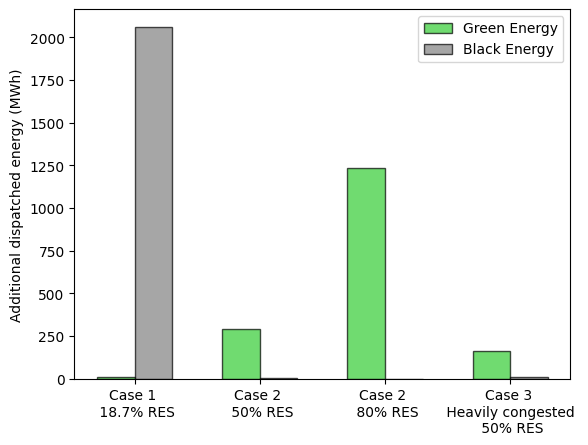

In [4]:
import matplotlib.pyplot as plt

# Assuming you have dataframes containing green and black energy for each scenario
# Let's call them green_energy_scenario1, black_energy_scenario1, green_energy_scenario2, black_energy_scenario2,
# green_energy_scenario3, black_energy_scenario3, green_energy_scenario4, and black_energy_scenario4

# Data for each scenario
labels = ["Case 1 \n 18.7% RES",
    "Case 2 \n 50% RES",
    "Case 2 \n 80% RES",
    "Case 3 \n Heavily congested \n 50% RES",]
green_energy = [
    11,
    290,
    1232,
    165

]
black_energy = [
    2061,
    3.7,
    0.000037,
    12.4
]

x = list(range(len(labels)))
bar_width = 0.3
plt.bar([i - bar_width/2 for i in x], green_energy, color=(0.2, 0.8, 0.2), alpha = 0.7, edgecolor = 'black',width=bar_width, label='Green Energy')

# Plotting black energy
plt.bar([i + bar_width/2 for i in x], black_energy, color='grey', alpha = 0.7, edgecolor = 'black', width=bar_width, label='Black Energy')

# # Plotting green energy
# plt.bar(x, green_energy, color='green', width=0.4, label='Green Energy')

# # Plotting black energy
# plt.bar(x, black_energy, color='black', width=0.4, label='Black Energy', bottom=green_energy)

# plt.xlabel('Scenarios')
plt.ylabel('Additional dispatched energy (MWh)')
# plt.title('Energy Distribution for Different Scenarios')
plt.xticks(x, labels)
plt.legend()

plt.show()


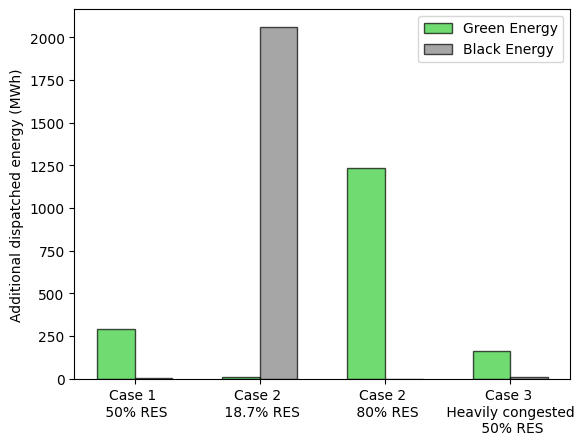

In [150]:
import matplotlib.pyplot as plt

# Assuming you have dataframes containing green and black energy for each scenario
# Let's call them green_energy_scenario1, black_energy_scenario1, green_energy_scenario2, black_energy_scenario2,
# green_energy_scenario3, black_energy_scenario3, green_energy_scenario4, and black_energy_scenario4

# Data for each scenario
labels = ["Case 1 \n 50% RES",
    "Case 2 \n 18.7% RES",
    "Case 2 \n 80% RES",
    "Case 3 \n Heavily congested \n 50% RES",]
green_energy = [
    290,
    11,
    1232,
    165

]
black_energy = [
    3.7,
    2061,
    0.000037,
    12.4
]

x = list(range(len(labels)))
bar_width = 0.3
plt.bar([i - bar_width/2 for i in x], green_energy, color=(0.2, 0.8, 0.2), alpha = 0.7, edgecolor = 'black',width=bar_width, label='Green Energy')

# Plotting black energy
plt.bar([i + bar_width/2 for i in x], black_energy, color='grey', alpha = 0.7, edgecolor = 'black', width=bar_width, label='Black Energy')

# # Plotting green energy
# plt.bar(x, green_energy, color='green', width=0.4, label='Green Energy')

# # Plotting black energy
# plt.bar(x, black_energy, color='black', width=0.4, label='Black Energy', bottom=green_energy)

# plt.xlabel('Scenarios')
plt.ylabel('Additional dispatched energy (MWh)')
# plt.title('Energy Distribution for Different Scenarios')
plt.xticks(x, labels)
plt.legend()

plt.show()


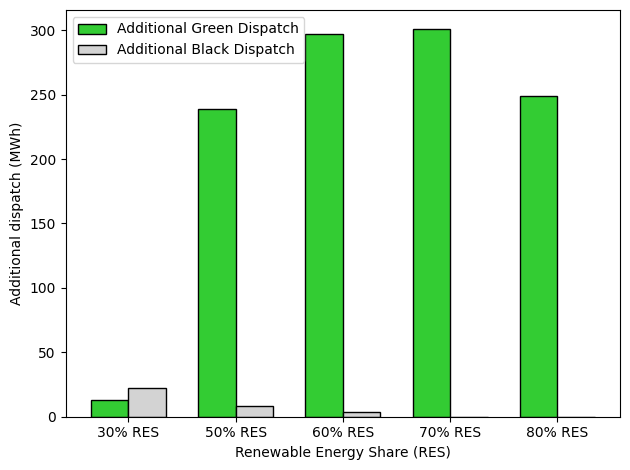

In [119]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the table (multiplied by 100)
categories = ['30% RES', '50% RES', '60% RES', '70% RES', '80% RES']
green_dispatch = [0.132 * 100, 2.390 * 100, 2.973 * 100, 3.006 * 100, 2.490 * 100]
black_dispatch = [0.222 * 100, 0.08 * 100, 0.037 * 100, 0 * 100, 0 * 100]

# Setting the positions and width for the bars
positions = np.arange(len(categories))
width = 0.35

# Nicer colors
green_color = (0.2, 0.8, 0.2) # A nicer green
light_grey_color = '#D3D3D3'  # Light grey for black dispatch

# Creating the bar plot with specified colors and outlines
fig, ax = plt.subplots()
bars1 = ax.bar(positions - width/2, green_dispatch, width, label='Additional Green Dispatch', color=green_color, edgecolor='black')
bars2 = ax.bar(positions + width/2, black_dispatch, width, label='Additional Black Dispatch', color=light_grey_color, edgecolor='black')

# Adding labels, title, and legend
ax.set_xlabel('Renewable Energy Share (RES)')
ax.set_ylabel('Additional dispatch (MWh)')
# ax.set_title('Additional Green and Black Dispatch for Various RES Levels')
ax.set_xticks(positions)
ax.set_xticklabels(categories)
ax.legend()

# Displaying the plot
plt.tight_layout()
plt.show()


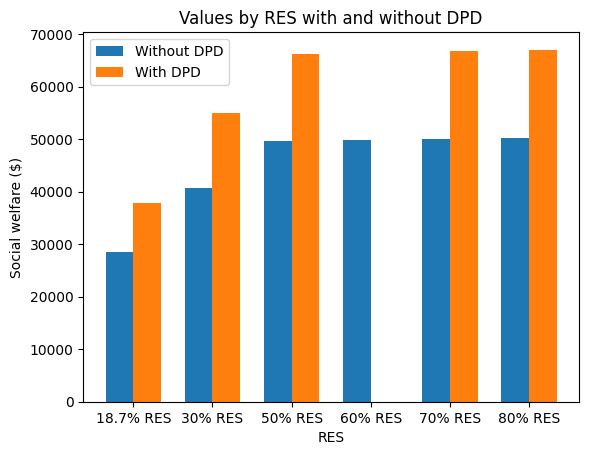

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the table
labels = ['18.7% RES', '30% RES', '50% RES', '60% RES', '70% RES', '80% RES']
without_dpd = [28549, 40631, 49613, 49856, 50003, 50128]
with_dpd = [37821, 54887, 66263, 6.6626, 66846, 67028]

# Convert labels to x-axis positions
x = np.arange(len(labels))

# Width of the bars
width = 0.35

# Create the bar plot
fig, ax = plt.subplots()
bars1 = ax.bar(x - width/2, without_dpd, width, label='Without DPD')
bars2 = ax.bar(x + width/2, with_dpd, width, label='With DPD')

# Adding labels and title
ax.set_xlabel('RES')
ax.set_ylabel('Social welfare ($)')
ax.set_title('Values by RES with and without DPD')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Display the plot
plt.show()


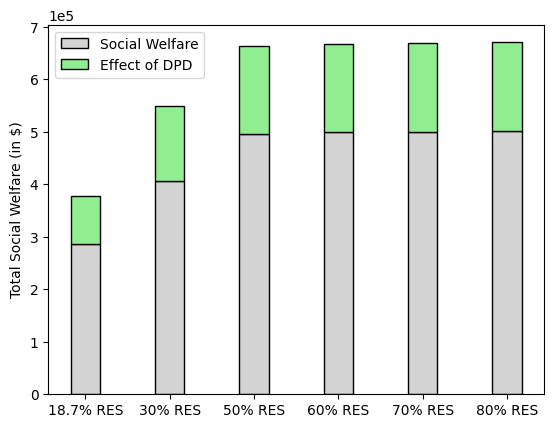

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the table
labels = ['18.7% RES', '30% RES', '50% RES', '60% RES', '70% RES', '80% RES']
without_dpd = np.array([28549, 40631, 49613, 49856, 50003, 50128]) * 10
with_dpd = np.array([37821, 54887, 66263, 66626, 66846, 67028]) * 10

# Calculate the difference
difference = with_dpd - without_dpd

# Convert labels to x-axis positions
x = np.arange(len(labels))

# Width of the bars
width = 0.35

# Create the bar plot
fig, ax = plt.subplots()

# Colors for the bars
color_without_dpd = 'lightgrey'
color_difference = 'lightgreen'

# Bars for without_dpd
bars1 = ax.bar(x, without_dpd, width, label='Social Welfare', color=color_without_dpd, edgecolor='black')

# Bars for the difference on top of without_dpd
bars2 = ax.bar(x, difference, width, bottom=without_dpd, label='Effect of DPD', color=color_difference, edgecolor='black')

# Adding labels and title
# ax.set_xlabel('RES')
ax.set_ylabel('Total Social Welfare (in $)')
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
# ax.set_title('Effect of DPD')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Display the plot
plt.show()
